# Clasificación de imagenes 


Integrantes del grupo:


*   Sebastián Restrepo Betancur
*   Maria del Pilar Mira Londoño
*   Karen Andrea Amaya Muñoz
*   María Isabel Plata rivera





## Planteamiento del problema
---

Es gran importancia la identificación mediante algoritmos características importantes en las personas o en su indumentaria, por ejemplo, la importancia de identificar si una persona lleva o no puesta la mascarilla o tapabocas en un sistema de transporte público, la identificación de un operario que no usa el  equipamiento de seguridad, la identificacion si una persona porta un arma, entre otros, es amplia la gama de uso que va desde la seguridad industrial, salud publica, seguridad de estado, entre otros.  Es por tanto que este trabajo se aborda la creación de un modelo de clasificación para predecir si la persona en una fotografía tiene o no tiene gafas 🤓 , que podría ser punto de partida y de mucha utilidad para una gran variedad de industrias.

## Documentacion de la Base de datos y construccion:
---


La construcción de la base datos fue llevado a cabo bajo el siguiente dataset de imágenes abierto, que está compuesto básicamente por imágenes de personas con gafas y sin gafas generadas artificialmente por una red neuronal generativa adversaria **(Generative Adversarial Neural Network (GAN))**, para ver mas información del dataset visata el siguiente enlace en Kaggle: https://www.kaggle.com/jeffheaton/glasses-or-no-glasses.

A partir de allí se establecen dos carpetas las cuales seran divididas en nuestros focos de clasificacion una para los sujetos con gafas y otro para sujetos sin gafas. 
```
└── faces
    ├── glasses
    ├── no_glasses
```


Finalmente utilizamos el conjuntos [CMU Face image Data set](https://https://archive.ics.uci.edu/ml/datasets/CMU+Face+Images) para validar si el modelo de clasificación está prediciendo de manera correcta los sujetos, y mirar la eficiencia de este.


 **Imagen Cara Gafas**


Imagen inicial del modelo y entrada de la misma como imagen

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Librerias necesarias 
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import cv2 
import os 
from random import shuffle 
from tqdm import tqdm 
from PIL import Image
import warnings
warnings.filterwarnings('ignore')
import os
print(os.listdir("drive/MyDrive/LogisticProject/input"))## directorio individual

['images']


(-0.5, 199.5, 199.5, -0.5)

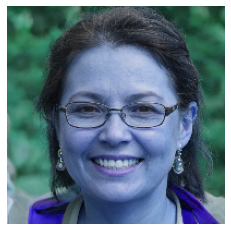

In [ ]:
img = cv2.imread("drive/MyDrive/LogisticProject/input/images/train/con_gafas/face-1255.png")
res = cv2.resize(img, dsize=(200, 200))
plt.imshow(res)
plt.axis('off')

**Imagen Cara sin Gafas**

(-0.5, 199.5, 199.5, -0.5)

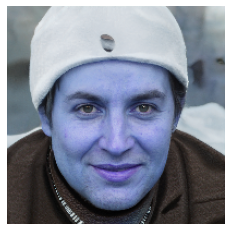

In [ ]:
img = cv2.imread("drive/MyDrive/LogisticProject/input/images/train/sin_gafas/face-2076.png")
res = cv2.resize(img, (image_size, image_size))
plt.imshow(res)
plt.axis('off')

## ¿Qué afecta la capacidad del modelo en el conjunto de validación?


Luego de hacer una prueba con el conjunto de imágenes CMU, llegamos a la conclusión de que el primer modelo de clasificación se ve afectado con este conjunto de validación cuando el tamaño de la imagen es más pequeña, cuando en la imagen no se pueden ver de manera clara el rostro de los sujetos, lo borroso o lo poco detallado de algo, los perfiles superiores e inferiores hacen parte importante a la hora de definir la imagen.

## ¿Hay alguna característica de las imágenes que mejore la capacidad de respuesta?

Un elemento o caracteristica importante de las imagenes son los ojos, cuando en la imagen se pueden observar los ojos de la persona y el rostro de forma clara, pues  es allí donde en una gran parte el modelo clasifica acertadamente.

También, cuando las gafas que tiene el sujeto son de un color intenso, por ejemplo el negro el modelo clasifica bien en un gran número de veces en comparación con las imágenes de sujetos que tienen gafas con monturas de colores más apagados, la calidad de las imagenes tambien juega un papel importante, el perfil, el lugar y la manera como se toman hacen parte importante. Por otro lado, el modelo se entrenó en su mayoría con personas sin lentes y con lentes de lectura, es decir, que posiblemente aumentando el conjunto de entrenamineto con personas usando gafas de sol, pueda mejorar la capacidad predictiva del modelo.

***A continuación se ilustra dos modelos de clasificacion utilizados en este trabajo:***

# Clasificacion de imagenes por medio de regresión logística

El siguiente es un clasificador basado en **búsqueda en cuadrícula** el cuál se basa en un metodo para encontrar la mejor combinación posible de hiperparámetros en los que el modelo logra la mayor precisión. Los datos son utilizados para dividirlos en un conjunto de entrenamiento y validación, un conjunto de validación se utiliza para validar los modelos. Para ello realizamos distintas pruebas dentro del modelo de personas con gafas y sin gafas.


In [ ]:
# directorio de imagenes
train_Gafas = "drive/MyDrive/LogisticProject/input/images/train/con_gafas"
train_sin_Gafas= "drive/MyDrive/LogisticProject/input/images/train/sin_gafas"
test_va_gafas= "drive/MyDrive/LogisticProject/input/images/val/va_gafas"
test_va_sin_gafas= "drive/MyDrive/LogisticProject/input/images/val/va_singafas"
image_size = 200 # tamaño de las imagenes para validacion

## **Escala de grises:**
Recuadro de ilustracion de la manera como el clasificador carga las imagenes y las distribuye de manera tal que las deja en recuadro de grises:

100%|██████████| 400/400 [00:25<00:00, 15.60it/s]


Text(0.5, 1.0, 'Sujeto con Gafas y sin gafas escala de grises ')

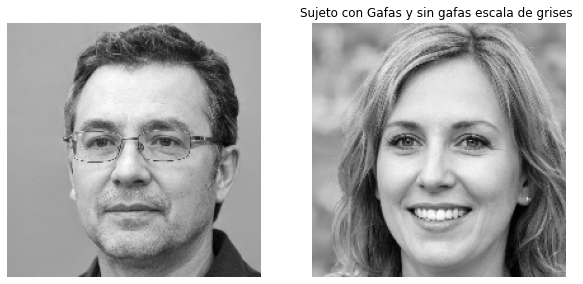

In [ ]:
for image in tqdm(os.listdir(train_Gafas)): 
    path = os.path.join(train_Gafas, image)
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    img = cv2.resize(img, (image_size, image_size)).flatten()   
    np_img=np.asarray(img)
    
for image2 in tqdm(os.listdir(train_sin_Gafas)): 
    path = os.path.join(train_sin_Gafas, image2)
    img2 = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    img2 = cv2.resize(img2, (image_size, image_size)).flatten() 
    np_img2=np.asarray(img2)

plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(np_img.reshape(image_size, image_size), cmap='gray')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(np_img2.reshape(image_size, image_size), cmap='gray')
plt.axis('off')
plt.title("Sujeto con Gafas y sin gafas escala de grises ")

In [ ]:
def train_data():## Guardar el reprocesamiento de las imagenes en listas(deben ser de igual tamaño ambos)
    train_data_gafas = [] 
    train_data_sin_gafas=[]
    for image1 in tqdm(os.listdir(train_Gafas)): 
        path = os.path.join(train_Gafas, image)
        img1 = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
        img1 = cv2.resize(img1, (image_size, image_size))
        train_data_gafas.append(img1) 
    for image2 in tqdm(os.listdir(train_sin_Gafas)): 
        path = os.path.join(train_sin_Gafas, image2)
        img2 = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
        img2 = cv2.resize(img2, (image_size, image_size))
        train_data_sin_gafas.append(img2) 
    
    train_data= np.concatenate((np.asarray(train_data_gafas),np.asarray(train_data_sin_gafas)),axis=0)
    return train_data 

In [ ]:
def test_data():
    test_data_va_gafas = [] 
    test_data_va_sin_gafas=[]
    for image1 in tqdm(os.listdir(test_va_gafas)): 
        path = os.path.join(test_va_gafas, image1)
        img1 = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
        img1 = cv2.resize(img1, (image_size, image_size))
        test_data_va_gafas.append(img1) 
    for image2 in tqdm(os.listdir(test_va_sin_gafas)): 
        path = os.path.join(test_va_sin_gafas, image2)
        img2 = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
        img2 = cv2.resize(img2, (image_size, image_size))
        test_data_va_sin_gafas.append(img2) 
    
    test_data= np.concatenate((np.asarray(test_data_va_gafas),np.asarray(test_data_va_sin_gafas)),axis=0) 
    return test_data 

In [ ]:
train_data = train_data() # Cargar las imagenes en arrays concatenados
test_data = test_data() # Cargar las imagenes en array concatenados

100%|██████████| 200/200 [00:11<00:00, 16.71it/s]


In [ ]:
x_data= np.concatenate((train_data,test_data),axis=0)
x_data = (x_data-np.min(x_data))/(np.max(x_data)-np.min(x_data))

In [ ]:
z1 = np.zeros(400)# imagenes que entran en el modelo
o1 = np.ones(400)
Y_train = np.concatenate((o1, z1), axis=0)
z = np.zeros(200)
o = np.ones(200)
Y_test = np.concatenate((o, z), axis=0)

In [ ]:
y_data=np.concatenate((Y_train,Y_test),axis=0).reshape(x_data.shape[0],1)

In [ ]:
print("Forma de X(vector): " , x_data.shape)
print("Forma de Y(vector): " , y_data.shape)

Forma de X(vector):  (1200, 200, 200)
Forma de Y(vector):  (1200, 1)


In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.15, random_state=42)
number_of_train = x_train.shape[0]
number_of_test = x_test.shape[0]

In [ ]:
x_train_flatten = x_train.reshape(number_of_train,x_train.shape[1]*x_train.shape[2])
x_test_flatten = x_test.reshape(number_of_test,x_test.shape[1]*x_test.shape[2])
print("Archivo train plano en X:",x_train_flatten.shape)
print("Archivo test plano en X:",x_test_flatten.shape)

Archivo train plano en X: (1020, 40000)
Archivo test plano en X: (180, 40000)


In [ ]:
x_train = x_train_flatten.T
x_test = x_test_flatten.T
y_test = y_test.T
y_train = y_train.T
print("train de X: ",x_train.shape)
print("Test de X: ",x_test.shape)
print("Train de Y: ",y_train.shape)
print("Test de Y: ",y_test.shape)

train de X:  (40000, 1020)
Test de X:  (40000, 180)
Train de Y:  (1, 1020)
Test de Y:  (1, 180)


## **Regresión logística:**

Creacion del modelo de regresión logistica a partir de las imagenes que tenemos dentro del modelo(400 para entrenamiento de imagenes con gafas y otros 400 sin gafas; por ultimo de manera similar un proceso de validacion con 200 imagenes tanto de test para gafas y sin gafas).

In [ ]:
## Definicon de funciones:
def initialize_weights_and_bias(dimension):
    w = np.full((dimension,1),0.01)
    b = 0.0
    return w, b

def sigmoid(z):
    y_head = 1/(1+np.exp(-z))
    return y_head

def forward_backward_propagation(w,b,x_train,y_train):
    # forward propagation
    z = np.dot(w.T,x_train) + b
    y_head = sigmoid(z)
    loss = -y_train*np.log(y_head)-(1-y_train)*np.log(1-y_head)
    cost = (np.sum(loss))/x_train.shape[1]
    # backward propagation
    derivative_weight = (np.dot(x_train,((y_head-y_train).T)))/x_train.shape[1]
    derivative_bias = np.sum(y_head-y_train)/x_train.shape[1]
    gradients = {"derivative_weight": derivative_weight,"derivative_bias": derivative_bias}
    return cost,gradients

def update(w, b, x_train, y_train, learning_rate,number_of_iterarion):
    cost_list = []
    cost_list2 = []
    index = []
    
    for i in range(number_of_iterarion):
        
        cost,gradients = forward_backward_propagation(w,b,x_train,y_train)
        cost_list.append(cost)
        
        w = w - learning_rate * gradients["derivative_weight"]
        b = b - learning_rate * gradients["derivative_bias"]
        if i % 100 == 0:
            cost_list2.append(cost)
            index.append(i)
            print ("Costo despues de iteraccion %i: %f" %(i, cost))
    
    parameters = {"weight": w,"bias": b}
    plt.plot(index,cost_list2)
    plt.xticks(index,rotation='vertical')
    plt.xlabel("Numero de interacciones")
    plt.ylabel("Costo")
    plt.show()
    return parameters, gradients, cost_list

def predict(w,b,x_test):
    
    z = sigmoid(np.dot(w.T,x_test)+b)
    Y_prediction = np.zeros((1,x_test.shape[1]))

    for i in range(z.shape[1]):
        if z[0,i]<= 0.5:
            Y_prediction[0,i] = 0
        else:
            Y_prediction[0,i] = 1

    return Y_prediction

def logistic_regression(x_train, y_train, x_test, y_test, learning_rate ,  num_iterations):

    dimension =  x_train.shape[0]
    w,b = initialize_weights_and_bias(dimension)

    parameters, gradients, cost_list = update(w, b, x_train, y_train, learning_rate,num_iterations)
    
    y_prediction_test = predict(parameters["weight"],parameters["bias"],x_test)
    y_prediction_train = predict(parameters["weight"],parameters["bias"],x_train)
    
    print("Presición de Train: {} %".format(round(100 - np.mean(np.abs(y_prediction_test - y_test)) * 100,2)))
    print("Presición de Test: {} %".format(round(100 - np.mean(np.abs(y_prediction_train - y_train)) * 100,2)))

Costo despues de cada iteraccion del modelo de regresion logistica(se espera que sea menor a 0.1)

Costo despues de iteraccion 0: nan
Costo despues de iteraccion 100: 0.765343
Costo despues de iteraccion 200: 0.439730
Costo despues de iteraccion 300: 0.076954
Costo despues de iteraccion 400: 0.061347
Costo despues de iteraccion 500: 0.052952
Costo despues de iteraccion 600: 0.047117
Costo despues de iteraccion 700: 0.042746
Costo despues de iteraccion 800: 0.039308
Costo despues de iteraccion 900: 0.036492
Costo despues de iteraccion 1000: 0.034111
Costo despues de iteraccion 1100: 0.032046
Costo despues de iteraccion 1200: 0.030220
Costo despues de iteraccion 1300: 0.028583
Costo despues de iteraccion 1400: 0.027099


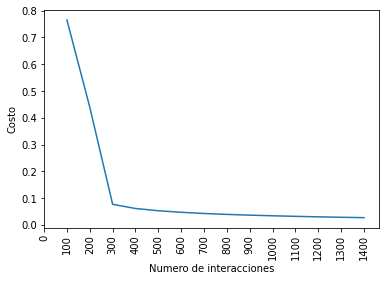

Presición de Train: 97.22 %
Presición de Test: 99.8 %


In [ ]:
logistic_regression(x_train, y_train, x_test, y_test,learning_rate = 0.01, num_iterations = 1500)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
grid={"C":np.logspace(-3,3,7),"penalty":["l1","l2"]}, ## greasearch despues de la regresion
logistic_regression=LogisticRegression(random_state=42)
log_reg_cv=GridSearchCV(logistic_regression,grid,cv=10)
log_reg_cv.fit(x_train.T,y_train.T)


GridSearchCV(cv=10, estimator=LogisticRegression(random_state=42),
             param_grid=({'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                          'penalty': ['l1', 'l2']},))

In [ ]:
print("Mejor hiperparametro: ", log_reg_cv.best_params_)
print("Presición: ", log_reg_cv.best_score_)

Mejor hiperparametro:  {'C': 0.1, 'penalty': 'l2'}
Presición:  0.9715686274509803


In [ ]:
log_reg= LogisticRegression(C=1,penalty="l2")
log_reg.fit(x_train.T,y_train.T)
print("Presición de Test: {} ".format(log_reg.fit(x_test.T, y_test.T).score(x_test.T, y_test.T)))
print("Presicion de Train: {} ".format(log_reg.fit(x_train.T, y_train.T).score(x_train.T, y_train.T)))

Presición de Test: 1.0 
Presicion de Train: 1.0 


## Modelo de machine Learnin SKlearn

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
model = LogisticRegression()

In [ ]:
x_train = x_train_flatten
x_test = x_test_flatten
y_test = y_test.T
y_train = y_train.T

x_train.shape, y_train.shape, x_test.shape, y_test.shape ## Vectores

((1020, 40000), (1020, 1), (180, 40000), (180, 1))

In [ ]:
model.fit(x_train, y_train)

LogisticRegression()

**Score del Modelo:**

In [ ]:
model.score(x_test, y_test)

0.9777777777777777

In [ ]:
validacion_1= "drive/MyDrive/LogisticProject/input/images/test2/descom"

In [ ]:
def validacion():
    validaciones = [] 
    for image1 in tqdm(os.listdir(validacion_1)): 
        path = os.path.join(validacion_1, image1)
        img1 = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
        img1 = cv2.resize(img1, (image_size, image_size))
        validaciones.append(img1)
    final=np.asarray(validaciones)
    return final 
prueba=validacion()
number_of_prueba=prueba.shape[0]
prueba_flatten = prueba.reshape(number_of_prueba,prueba.shape[1]*prueba.shape[2])
prueba=prueba_flatten

100%|██████████| 1865/1865 [00:37<00:00, 49.41it/s] 


**Validacion imagenes:**

El siguiente es la prueba de la validacion del dataset [CMU Face image Data set](https://https://archive.ics.uci.edu/ml/datasets/CMU+Face+Images) con el cual se pretendia validar el modelo; por eficiencia se valido todo pero en este solo se muestre algunas(200 imagenes); queda a gusto del lector validar las 1895 imagenes en caso de que lo desee.

In [ ]:
ans=model.predict(prueba[:200]) # Numero de gafas a ser validadas

In [ ]:
ans=list(map(lambda x:"con gafas"if x else "sin gafas",ans))

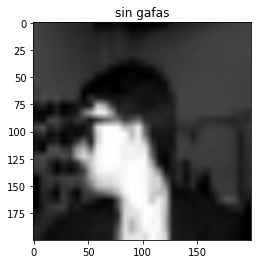

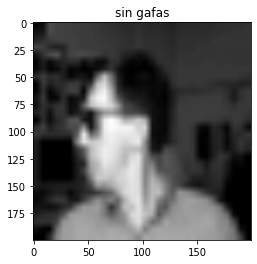

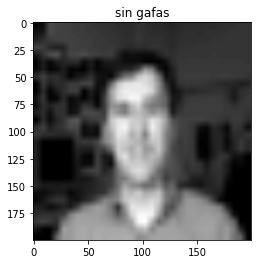

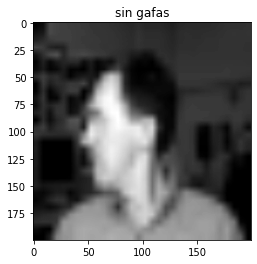

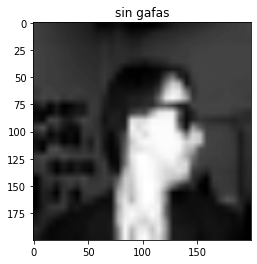

...

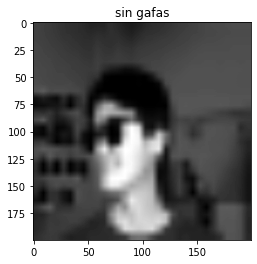

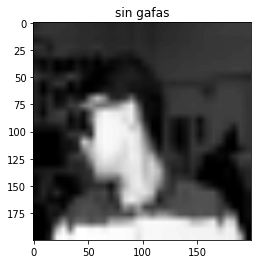

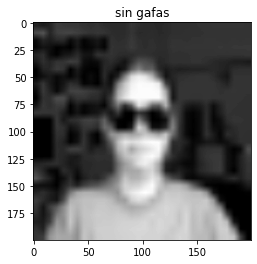

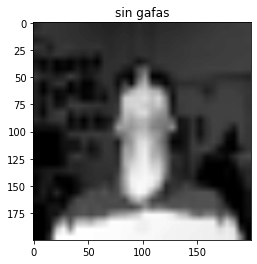

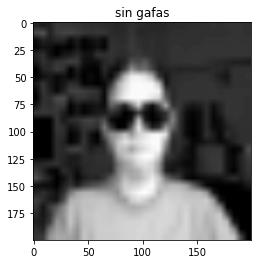

In [ ]:
for i in range(len(ans)): #$ lectura de archivos test
  plt.imshow(prueba[i].reshape(200,200), cmap='gray')
  plt.title(ans[i])
  plt.show()

- 

# **Segundo modelo utilizando Tensorflow**

El siguiente es un modelo de respaldo utilizando la libreria tensorflow la cual permite obtener de mejor manera predicciones para la carpeta test 2

In [ ]:
import keras
import tensorflow 
import tensorflow as tf
from tensorflow import keras


categorias = []
labels = []
imagenes = []

categorias = os.listdir("drive/MyDrive/LogisticProject/input/images/ent")


print(categorias)


x = 0
for directorio in categorias:
    for imagen in os.listdir("drive/MyDrive/LogisticProject/input/images/ent/"+directorio):
        img = Image.open("drive/MyDrive/LogisticProject/input/images/ent/"+
                         directorio+"/"+imagen).resize((200, 200))
        img = np.asarray(img)
        imagenes.append(img)
        labels.append(x)
    x += 1

    

['con gafas', 'sin gafas']


(1118, 200, 200)


<function matplotlib.pyplot.show>

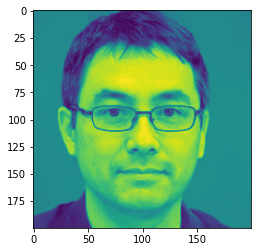

In [ ]:
imagenes = np.asanyarray(imagenes)
imagenes = imagenes[:, :, :, 0]
imagenes.shape
print(imagenes.shape)
plt.figure()
plt.imshow(imagenes[89])
plt.colorbar
plt.grid(False)
plt.show


In [ ]:
labels = np.asarray(labels)
print(labels)

[0 0 0 ... 1 1 1]


#Creación y entrenamiento del modelo con Tensorflow y Keras

 Comenzamos  a construir el modelo de aprendizaje  usando TensorFlow, luego con compile se hace la compilación del modelo con el optimizador Adam , la cual  configura el modelo para el entrenamiento.

 Seguido de esto se puede comenzar el entrenamiento llamando al fitmétodo en la instancia del modelo.

In [ ]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(200, 200)),
    keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.2),

    keras.layers.Dense(2, activation='softmax'),

])
model.compile(optimizer='adam', ## compilación del modelo, la cual  configura el modelo para el entrenamiento.
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(imagenes, labels, epochs=20)
trained = model.fit(imagenes, labels, epochs=20)

Epoch 1/20
35/35 [==============================] - 3s 75ms/step - loss: 1799.4565 - accuracy: 0.5250
Epoch 2/20
35/35 [==============================] - 2s 71ms/step - loss: 28.7113 - accuracy: 0.5635
Epoch 3/20
35/35 [==============================] - 3s 72ms/step - loss: 7.0033 - accuracy: 0.5036
Epoch 4/20
35/35 [==============================] - 2s 66ms/step - loss: 15.6005 - accuracy: 0.5197
Epoch 5/20
35/35 [==============================] - 3s 80ms/step - loss: 0.6930 - accuracy: 0.5197
Epoch 6/20
35/35 [==============================] - 3s 72ms/step - loss: 0.6929 - accuracy: 0.5197
Epoch 7/20
35/35 [==============================] - 2s 65ms/step - loss: 0.6928 - accuracy: 0.5197
Epoch 8/20
35/35 [==============================] - 2s 71ms/step - loss: 0.6928 - accuracy: 0.5197
Epoch 9/20
35/35 [==============================] - 3s 74ms/step - loss: 0.6927 - accuracy: 0.5197
Epoch 10/20
35/35 [==============================] - 3s 80ms/step - loss: 0.6926 - accuracy: 0.5197
Epoc

 Una época se refiere a entrenar todo el conjunto de datos hacia adelante y hacia atrás una vez. Se utiliza en este caso  para indicar la precisión del modelo, luego de iterar 20 épocas se puede ver que la precisión del modelo en su última epoca fue del 52%, lo intentamos con 30 peero la verdad no variaba mucho la precisión.
 

Se ensaya el conjunto de datos CMU con una sola imagen para corrobar que esté ejecutando bien.

In [ ]:
img2 = 0
img2 = cv2.imread("drive/MyDrive/LogisticProject/input/images//pru/tammo_left_sad_sunglasses.pgm")## ensayo de una sola imagen
img2 = cv2.resize(img2, (200, 200))
img2 = (np.expand_dims(img2, 0))
img2 = np.asarray(img2)
img2 = img2[:, :, :, 0]
img2 = np.array(img2)
img2.shape
test = img2
print(test.shape)


(1, 200, 200)


In [ ]:
predicciones = model.predict(test)
test

array([[[ 5,  5,  5, ..., 21, 21, 21],
        [ 5,  5,  5, ..., 21, 21, 21],
        [ 5,  5,  5, ..., 21, 21, 21],
        ...,
        [ 9,  9,  9, ..., 35, 35, 35],
        [ 9,  9,  9, ..., 35, 35, 35],
        [ 9,  9,  9, ..., 35, 35, 35]]], dtype=uint8)

In [ ]:
print(predicciones)

print(np.argmax(predicciones))
clase = ["con gafas", "sin gafas"]
print(clase[np.argmax(predicciones)])


[[0.09767281 0.90232724]]
1
sin gafas


# Validación del segundo modelo con las imágenes del conjunto  CMU

In [ ]:

val = "drive/MyDrive/LogisticProject/input/images/test2/descom"
image_size=200

def valid():
    validac = [] 
    for image1 in tqdm(os.listdir(val)): 
        path = os.path.join(val, image1)
        img4 = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
        img4 = cv2.resize(img4, (image_size, image_size))
        validac.append(img4)
    new=np.asarray(validac)
    return new
prueba2=valid()

El sujeto no tiene gafas


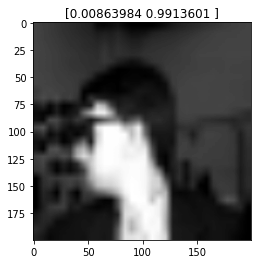

El sujeto tiene gafas


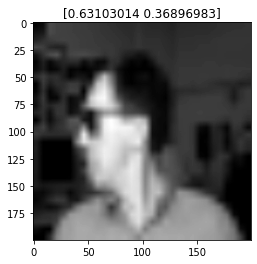

El sujeto tiene gafas


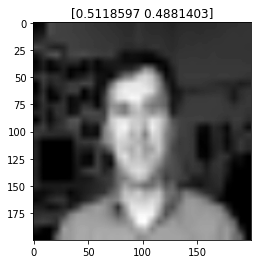

El sujeto no tiene gafas


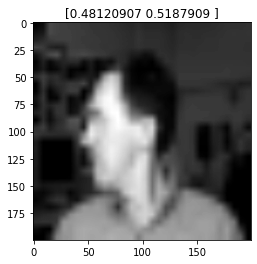

El sujeto no tiene gafas


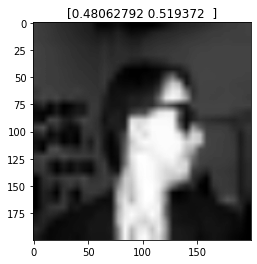

El sujeto tiene gafas


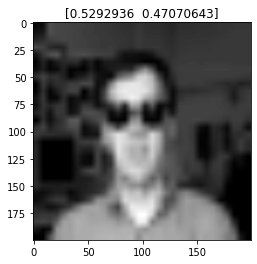

El sujeto no tiene gafas


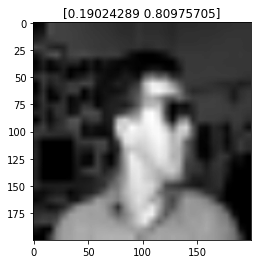

El sujeto tiene gafas


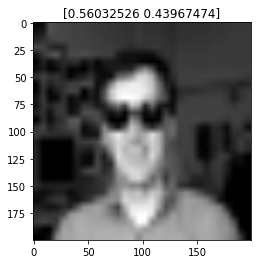

El sujeto tiene gafas


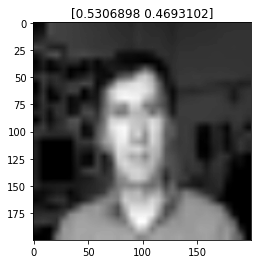

El sujeto no tiene gafas


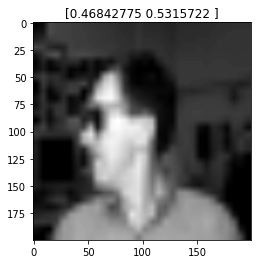

El sujeto no tiene gafas


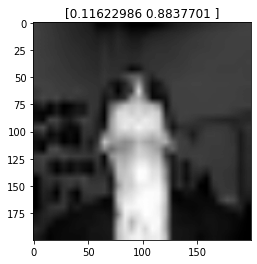

El sujeto no tiene gafas


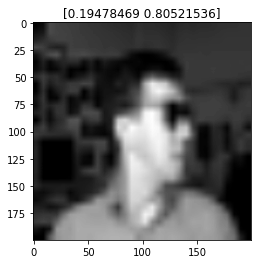

El sujeto no tiene gafas


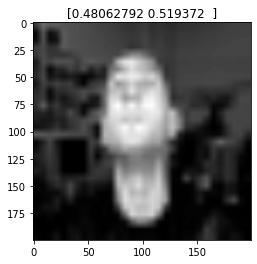

El sujeto no tiene gafas


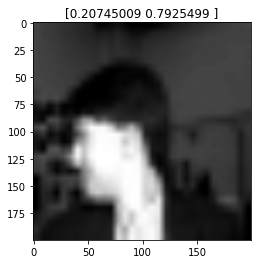

El sujeto no tiene gafas


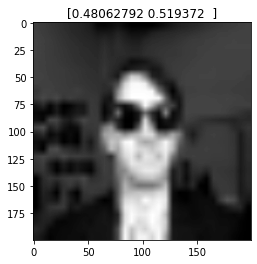

El sujeto no tiene gafas


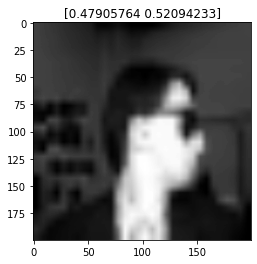

El sujeto no tiene gafas


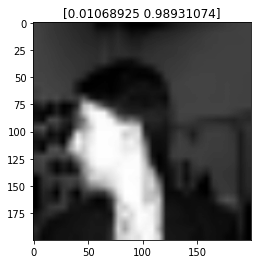

El sujeto no tiene gafas


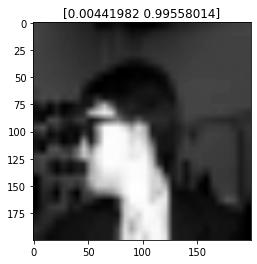

El sujeto no tiene gafas


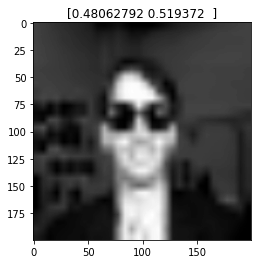

El sujeto no tiene gafas


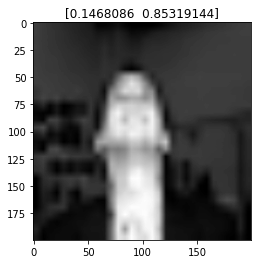

El sujeto no tiene gafas


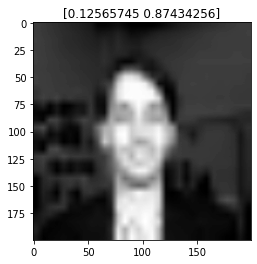

El sujeto no tiene gafas


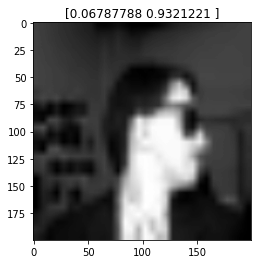

El sujeto no tiene gafas


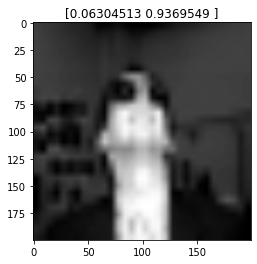

El sujeto no tiene gafas


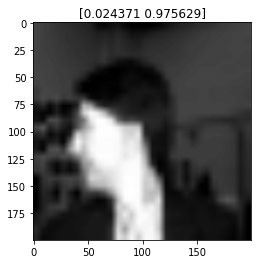

El sujeto no tiene gafas


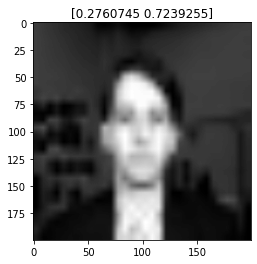

El sujeto tiene gafas


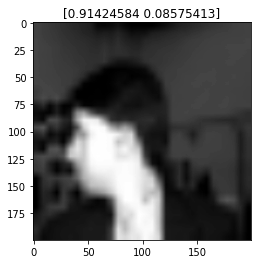

El sujeto no tiene gafas


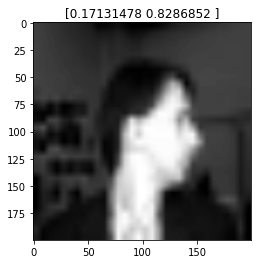

El sujeto no tiene gafas


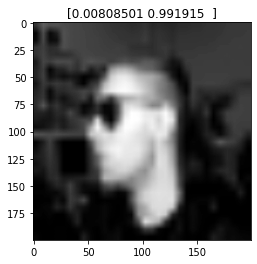

El sujeto no tiene gafas


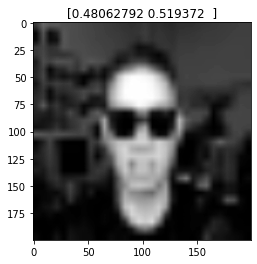

El sujeto no tiene gafas


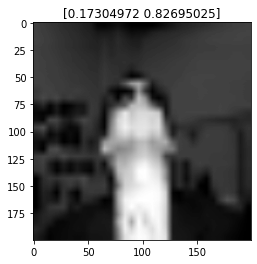

El sujeto no tiene gafas


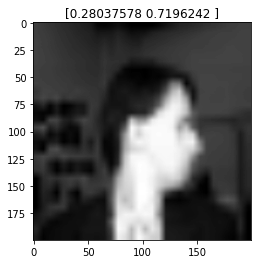

El sujeto no tiene gafas


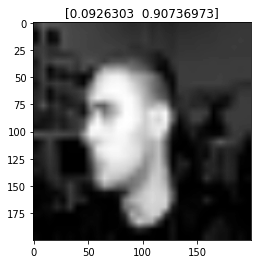

El sujeto no tiene gafas


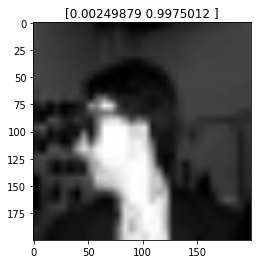

El sujeto no tiene gafas


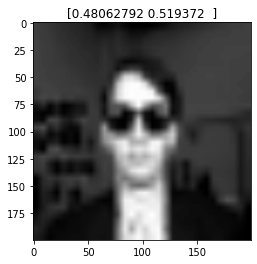

El sujeto no tiene gafas


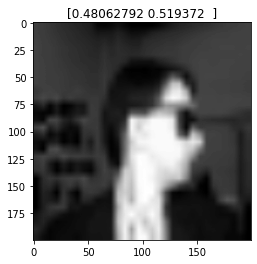

El sujeto no tiene gafas


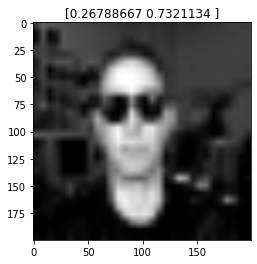

El sujeto no tiene gafas


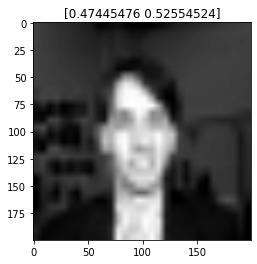

El sujeto no tiene gafas


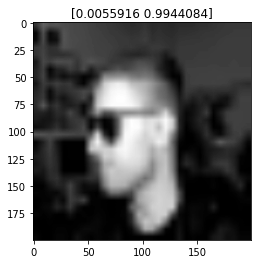

El sujeto no tiene gafas


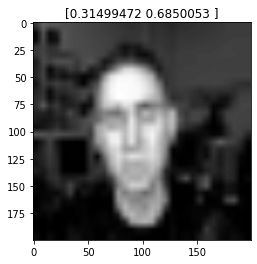

El sujeto no tiene gafas


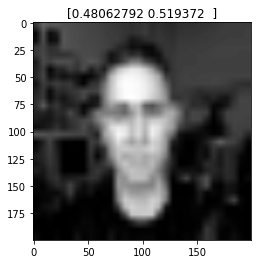

El sujeto no tiene gafas


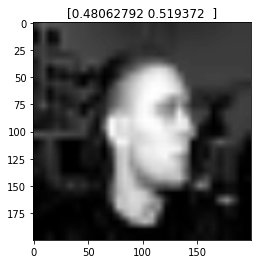

El sujeto no tiene gafas


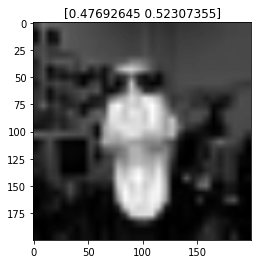

El sujeto no tiene gafas


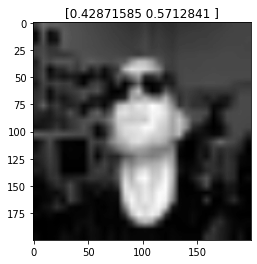

El sujeto no tiene gafas


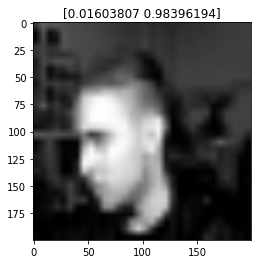

El sujeto no tiene gafas


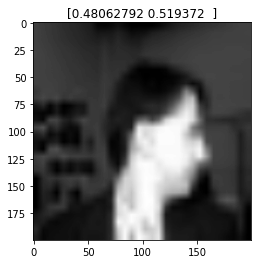

El sujeto no tiene gafas


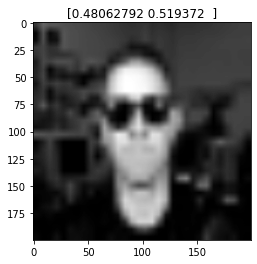

El sujeto no tiene gafas


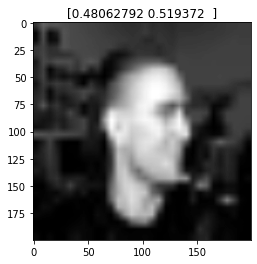

El sujeto no tiene gafas


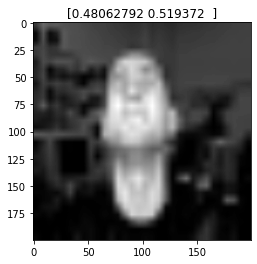

El sujeto no tiene gafas


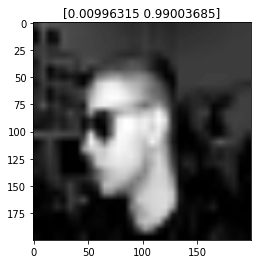

El sujeto no tiene gafas


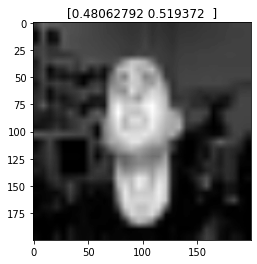

El sujeto no tiene gafas


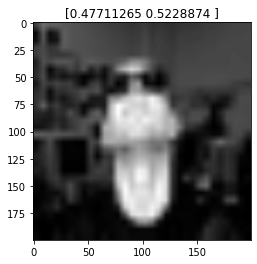

El sujeto no tiene gafas


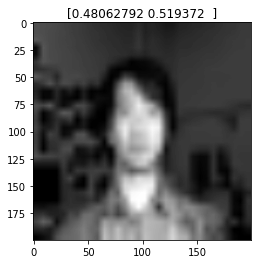

El sujeto no tiene gafas


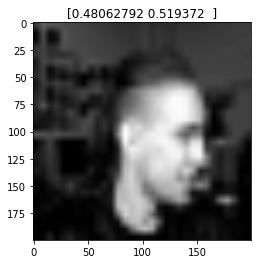

El sujeto no tiene gafas


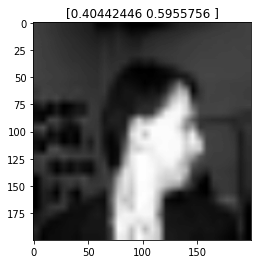

El sujeto no tiene gafas


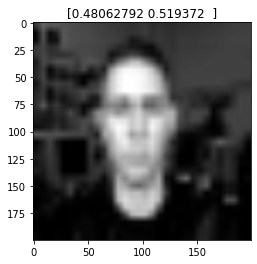

El sujeto no tiene gafas


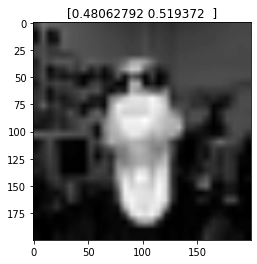

El sujeto no tiene gafas


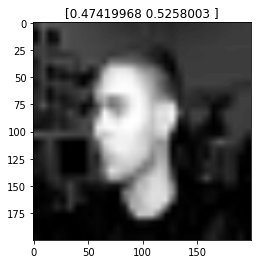

El sujeto no tiene gafas


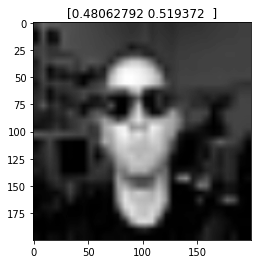

El sujeto no tiene gafas


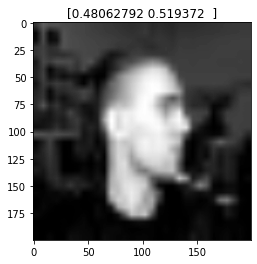

El sujeto no tiene gafas


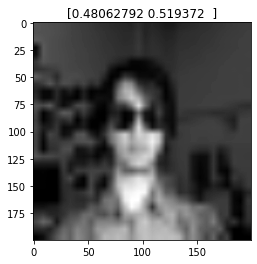

El sujeto no tiene gafas


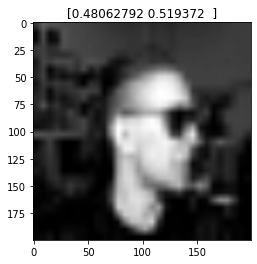

El sujeto no tiene gafas


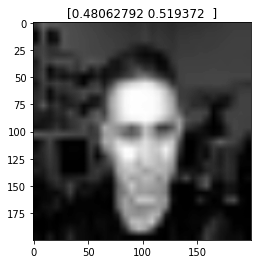

El sujeto no tiene gafas


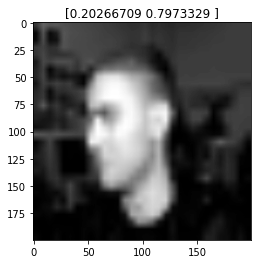

El sujeto no tiene gafas


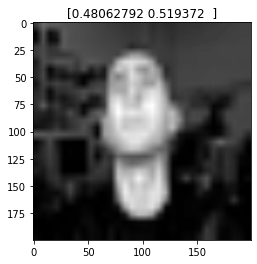

El sujeto no tiene gafas


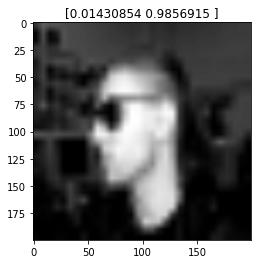

El sujeto no tiene gafas


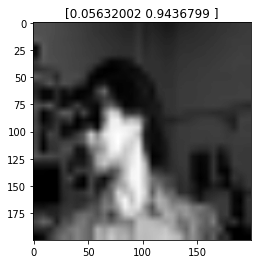

El sujeto no tiene gafas


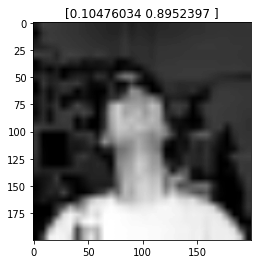

El sujeto no tiene gafas


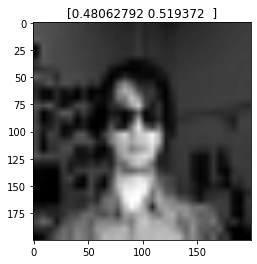

El sujeto no tiene gafas


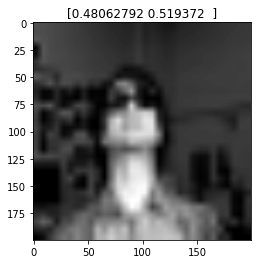

El sujeto no tiene gafas


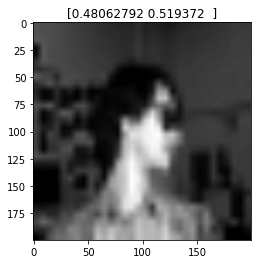

El sujeto no tiene gafas


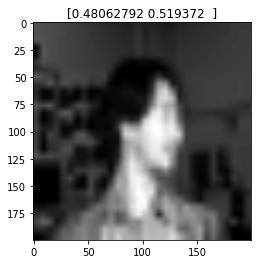

El sujeto no tiene gafas


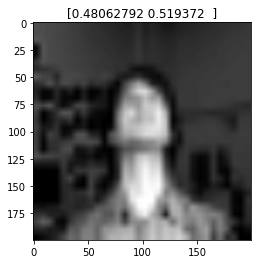

El sujeto no tiene gafas


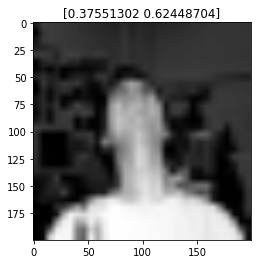

El sujeto no tiene gafas


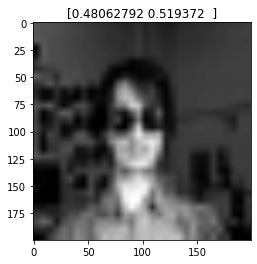

El sujeto no tiene gafas


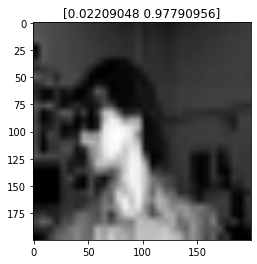

El sujeto no tiene gafas


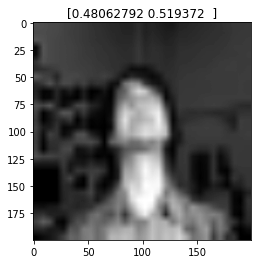

El sujeto no tiene gafas


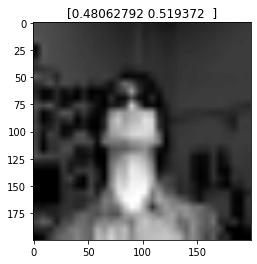

El sujeto no tiene gafas


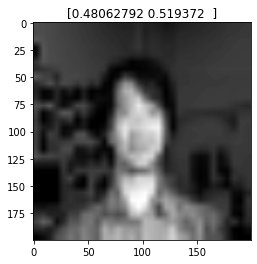

In [ ]:
ans=model.predict(prueba2[:100])
clase=["El sujeto tiene gafas","El sujeto no tiene gafas"]
for i in range(len(ans)): #$ lectura de archivos test
  print(clase[np.argmax(ans[i])])
  plt.imshow(prueba2[i].reshape(200,200), cmap='gray')
  plt.title(ans[i])
  plt.show()

## **Conclusiones:**

Despues de realizar un estudio a los dos modelos concluimos que ambos tienen fallas muy parecidas en diferentes partes, elementos de perfil, lugar, claridad y detalle de la imagen cobran importancia para determinar si el sujeto tiene o no gafas; por otro lado en el modelo 2(tensorflow) tiene una caracteristica en particular bastante importante y son las probabilidades donde vemos muy claramente que en general en los casos donde el modelo esta fallando este arroja una probabilidad casi 50% vs 50% lo que claramente permite dar conclusiones mas claras sobre el modelo y su aplicación.
Para anexar despues de validar modelos y ensayos la conclusion es que tensorflow valida mejor aunque no por una gran diferencia.

Cabe recordar que como se menciona anteriormente si en el conjunto de bases que se uso para el entrenamiento de los modelos se introdujeran más fotos de sujetos con gafas de sol esto podría 

# **Bibliografía:**



*   ML Bootcamp - Logistic Regression Image Classification, Clean vs Dirty Room Project. (2020, 30 julio). [Vídeo]. YouTube. https://www.youtube.com/watch?v=UzaIxfRIcEY  

*  Clasificación de imágenes | 2 etiquetas | Keras | Tensorflow | ¡Muy Básico! |Python. (2019, 31 diciembre). [Vídeo]. Youtube.https://www.youtube.com/watch?v=vjNaCJh7Ka4

*  Cómo clasificar imágenes de gatos con un modelo de regresión logística. (2020, 4 diciembre). ICHI.PRO. Recuperado 31 de enero de 2022, de https://ichi.pro/es/como-clasificar-imagenes-de-gatos-con-un-modelo-de-regresion-logistica-249992792070587

*  K. (s. f.). LogisticProject/image-classification-with-logistic-regression.ipynb at master · kunal-kushwaha/LogisticProject. GitHub. Recuperado 31 de enero de 2022, de https://github.com/kunal-kushwaha/LogisticProject/blob/master/code/image-classification-with-logistic-regression.ipynb



